# Performance Plot

## imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
from collections import defaultdict
import itertools

import sklearn
import sys,os
sys.path.append(os.path.abspath("/mnt/home/yjo10/ceph/CAMELS/MIEST/utils/"))
from imp import reload 
# Change in mymodule/'
import vib_utils
reload(vib_utils)
from vib_utils import *
import mist_utils
reload(mist_utils)
from mist_utils import *
import umap_utils
reload(umap_utils)
from umap_utils import *


import warnings
warnings.filterwarnings('ignore')

# Device Config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

sys.path.append(os.path.abspath("/mnt/home/yjo10/ceph/myutils/"))
import plt_utils as pu
from plt_utils import generateAxesForMultiplePlots, remove_inner_axes
# Dimension reduction and clustering libraries
import umap
import umap.plot
#import hdbscan
import sklearn.cluster as cluster
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestRegressor
from sklearn import manifold
from plt_utils import generateAxesForMultiplePlots
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
plt.rcParams['font.family']='serif'
from sklearn.decomposition import KernelPCA

## HI

### Two of TNG + SIMBA + ASTRID + EAGLE

#### Dataload

In [23]:
sims = ['TNG', 'SIMBA', 'ASTRID', 'EAGLE']; field='HI'
study_names = ["HI_cnn_enc_dec_zero_monopole_1","HI_cnn_zero_monopole_1_new","HI_cnn_zero_monopole_1_new_split"]
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'

combinations = list(itertools.combinations(sims, 2))
externals = [[x for x in sims if x not in comb] for comb in combinations]
data = []
ext  = []
for i, comb in enumerate(combinations):
    for fname in study_names:
        study_name = f"{comb[0]}_{comb[1]}_" + fname
        storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
        path       = f"/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
        print(path, comb)
        if os.path.isfile(path):
            print("file exists!")
            mist = MIST(sim=list(comb), field=field, batch_size=32, 
                        data_type = 'image',
                        normalization=True,
                        monopole = True,
                        device=device, robust_axis='sim')
            mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
            mist.get_score_cnn()
            data.append(mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False))
            tmp = list()
            for sim_ext in externals[i]:
                tmp.append(mist.test_on_cnn(sim_ext, show_score=True, data_return=True,show_plot=False))
            ext.append(tmp)
            break
    if i == 1: break

/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_SIMBA_HI_cnn_enc_dec_zero_monopole_1.db ('TNG', 'SIMBA')
file exists!
$\Omega_m$: MSE=0.000, % error=4.751%, R2 score=0.977,chi2=0.317, bias=-0.002
$\sigma_8$: MSE=0.002, % error=4.534%, R2 score=0.853,chi2=0.704, bias=-0.000
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.002, % error=13.945%, R2 score=0.847,chi2=2.136, bias=-0.023
$\sigma_8$: MSE=0.029, % error=20.317%, R2 score=-1.200,chi2=10.175, bias=-0.144
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.007, % error=18.415%, R2 score=0.458,chi2=8.294, bias=0.063
$\sigma_8$: MSE=0.013, % error=12.678%, R2 score=0.011,chi2=4.859, bias=-0.081
/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_ASTRID_HI_cnn_enc_dec_zero_monopole_1.db ('TNG', 'ASTRID')
file exists!
$\Omega_m$: MSE=0.000, % error=2.859%, R2 score=0.991,chi2=0.348, bias=0.001
$\sigma_8$: MSE=0.001, % error=3.641%, R2 score=0.896,chi2=0.931, bias=0.003
(15000, 1, 256, 256) (15000

In [57]:
ext[0][0][1]

(array([[0.43694651, 0.98240829],
        [0.44372204, 0.96765727],
        [0.4411259 , 0.94535559],
        ...,
        [0.32165024, 0.99689364],
        [0.31636563, 1.00811827],
        [0.31345922, 1.00271022]]),
 array([[0.03305079, 0.05658903],
        [0.03335201, 0.05666749],
        [0.03336982, 0.05643474],
        ...,
        [0.02996983, 0.05360487],
        [0.02993711, 0.05352056],
        [0.02991067, 0.05343484]]))

Text(0.5, 1.0, 'Tested on EAGLE')

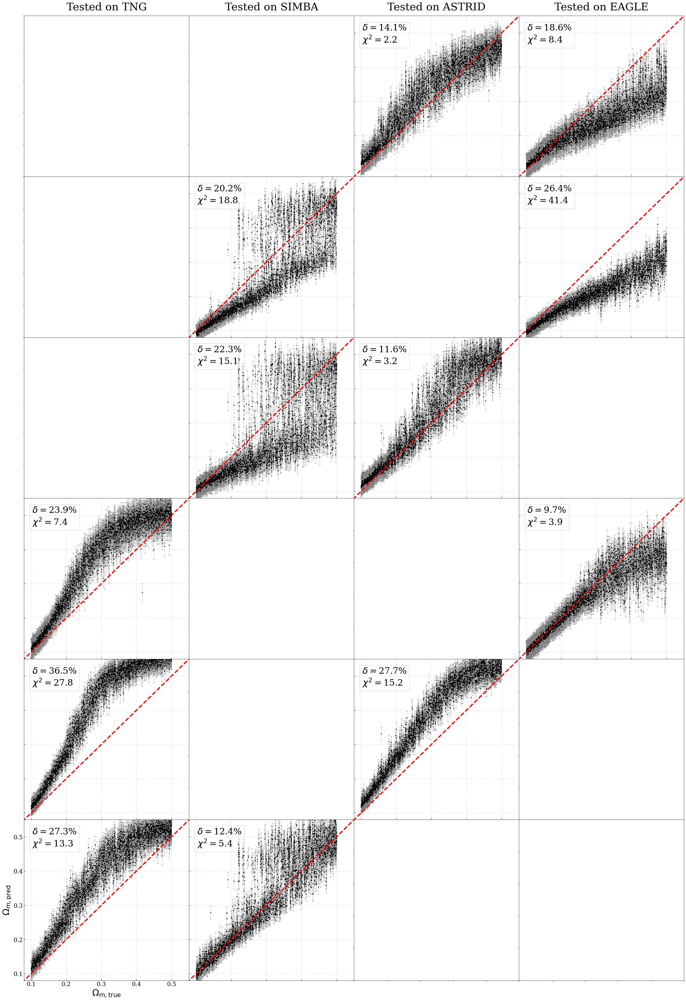

In [59]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 4,6
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(40,60),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
param = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
index_ext = {'TNG':0, 'SIMBA':1, 'ASTRID':2, 'EAGLE':3}

for i in range(Y):
    for j in range(X):
        if index_ext[externals[i][0]] == j:
            ext_tmp  = ext[i][0]
        elif index_ext[externals[i][1]] == j:
            ext_tmp  = ext[i][1]
        else:
            axes[j,i].set_xticklabels([])
            axes[j,i].set_yticklabels([])
            continue
        
        data_tmp = data[i]
        
        y_true = ext_tmp[0][index,param]
        y_mean = ext_tmp[1][0][index,param]
        y_std  = ext_tmp[1][1][index,param]

        
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        axes[j,i].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[j,i].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        #axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        axes[j,i].plot(ideal1,ideal1,"r",ls='--',lw=4,zorder=40)
        
        #rel_err = np.mean(np.abs(y_res))*100
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[j,i].text(.05, .95, text,
         ha='left', va='top', transform=axes[j,i].transAxes,
         bbox=props)
        
        axes[j,i].tick_params(direction='in', axis='both', which='both', length=6)
        axes[j,i].grid(ls=':')
        if i == Y-1 and j == 0:
            axes[j,i].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[j,i].set_ylabel(r"$\Omega_\mathrm{m, pred}$")
            #axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[j,i].set_xticklabels([])
            axes[j,i].set_yticklabels([])
        axes[j,i].set_xlim(0.08,0.55)
        axes[j,i].set_ylim(0.08,0.55)
    
        #axes[i,j].set_ylim(-.5,.8)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
axes[3,0].set_title('Tested on EAGLE',pad=20)
#plt.savefig('paper_plot/extensive_exploration.png',dpi=200, bbox_inches='tight')

#### plot for $\Omega_m$

##### old

NameError: name 'data_zero' is not defined

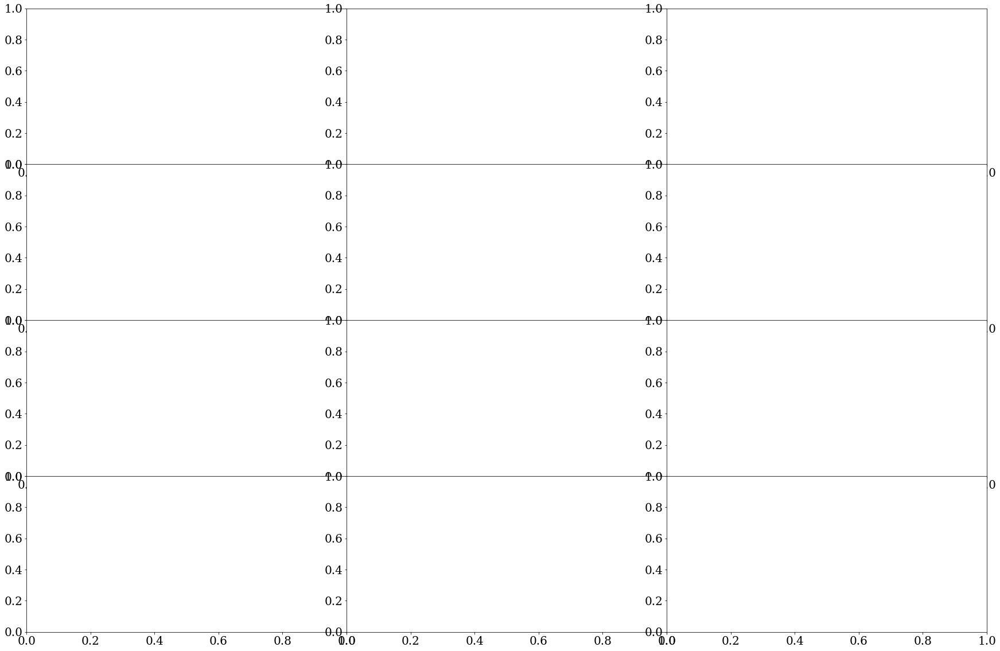

In [2]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,4


gridspec = {"width_ratios":[]}

fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_low, data_mid, data_high]
ast  = [ast_zero, ast_low, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.09,0.51)
        axes[i,j].set_ylim(-.5,.8)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(4):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_HI_performance_om.png',dpi=200, bbox_inches='tight')

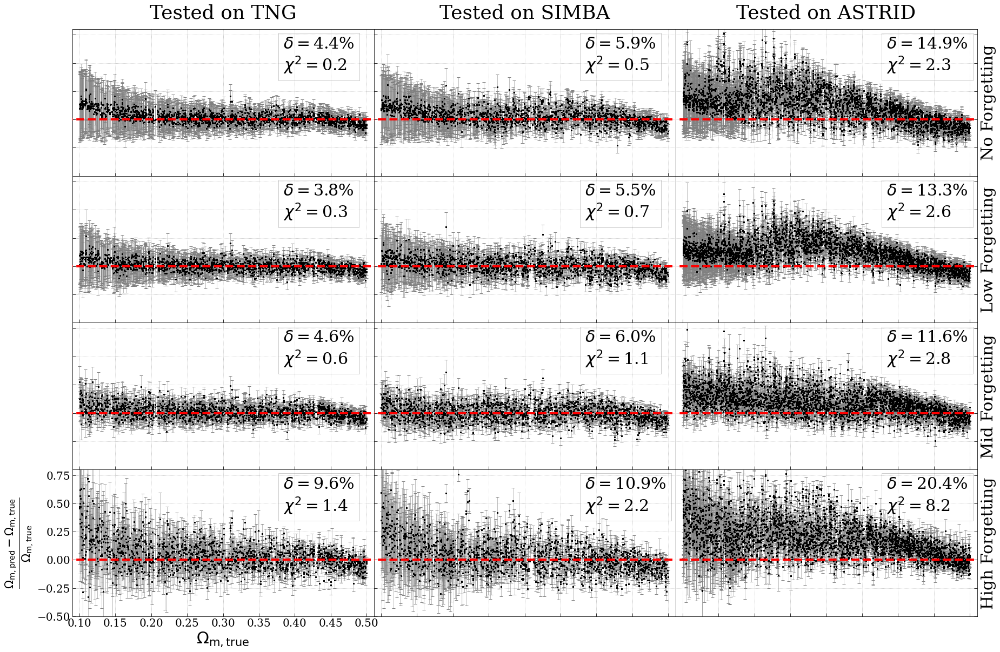

In [152]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,4
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_low, data_mid, data_high]
ast  = [ast_zero, ast_low, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.09,0.51)
        axes[i,j].set_ylim(-.5,.8)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(4):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_HI_performance_om.png',dpi=200, bbox_inches='tight')

##### new

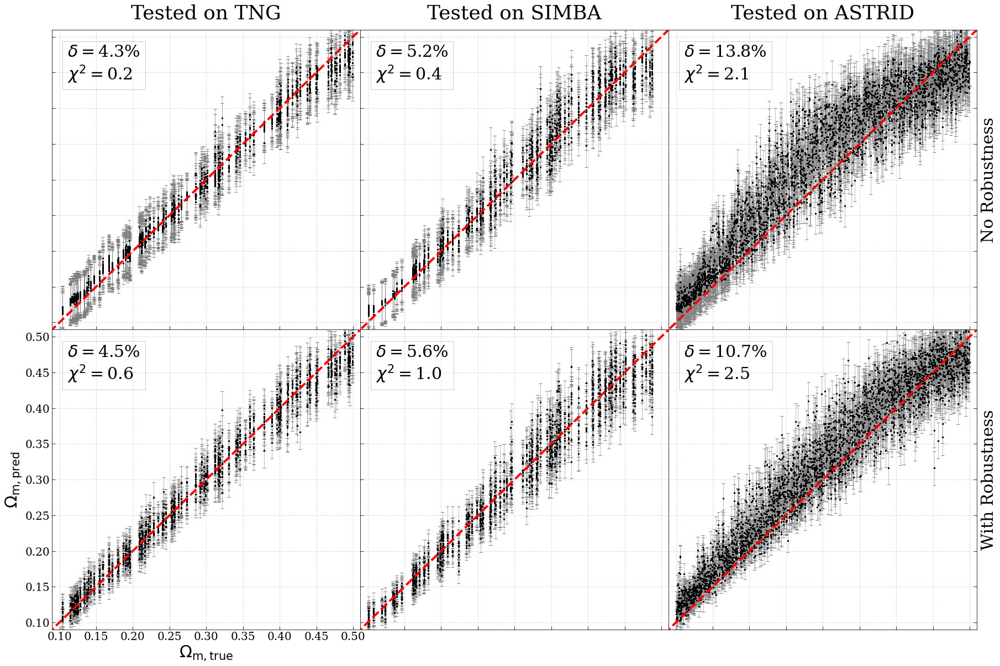

In [29]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,2
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid]
ast  = [ast_zero, ast_mid]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        #axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        axes[i,j].plot(ideal1,ideal1,"r",ls='--',lw=4,zorder=40)
        
        #rel_err = np.mean(np.abs(y_res))*100
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.05, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[i,j].set_ylabel(r"$\Omega_\mathrm{m, pred}$")
            #axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.09,0.51)
        axes[i,j].set_ylim(0.09,0.51)
        #axes[i,j].set_ylim(-.5,.8)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Robustness', 'With Robustness']
for i in range(Y):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_HI_performance_om_new.png',dpi=200, bbox_inches='tight')

#### Plot for $\sigma_8$

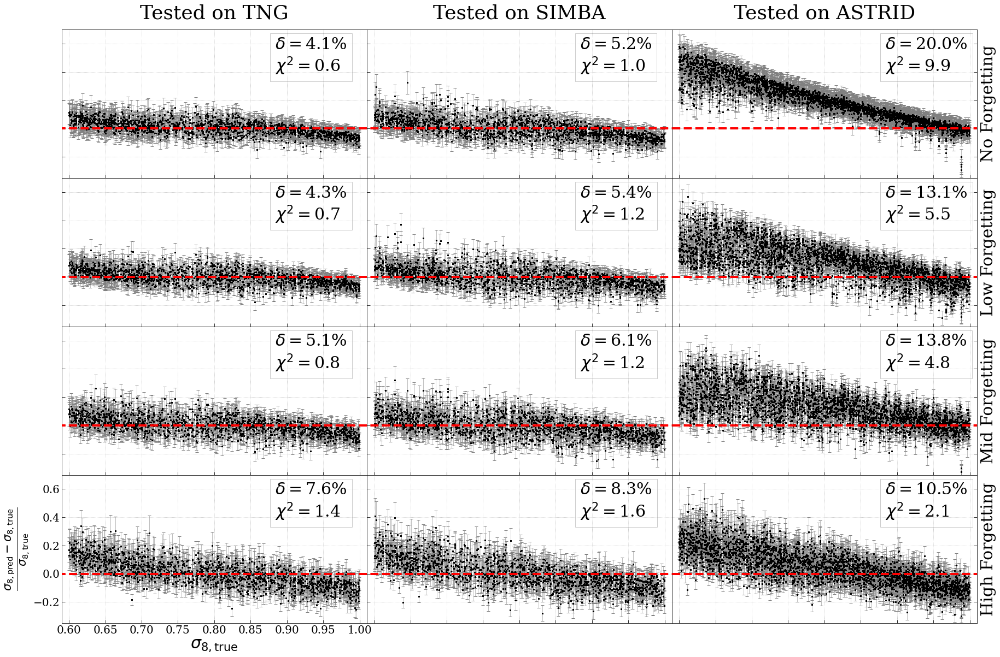

In [151]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,4
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 1 # sigma_8
ideal1 = np.linspace(0.0,2,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_low, data_mid, data_high]
ast  = [ast_zero, ast_low, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\sigma_\mathrm{8, true}$")
            axes[i,j].set_ylabel(r"$\frac{\sigma_\mathrm{8, pred}-\sigma_\mathrm{8, true}}{\sigma_\mathrm{8, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.59,1.01)
        axes[i,j].set_ylim(-.35,.7)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(4):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_HI_performance_sig.png',dpi=200, bbox_inches='tight')

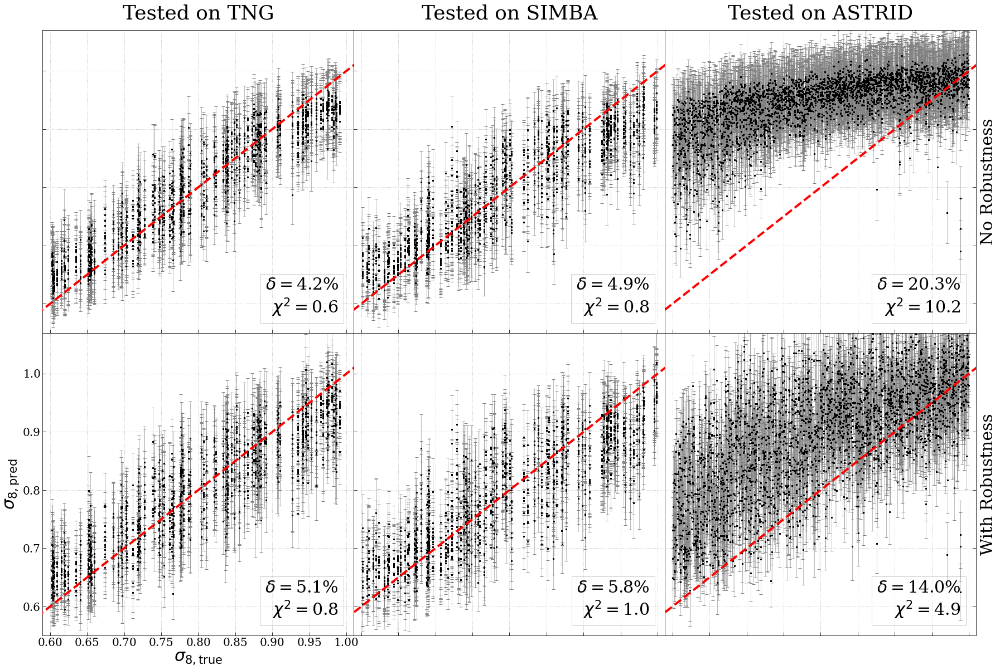

In [32]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,2
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 1 # sigma_8
ideal1 = np.linspace(0.0,2,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid]
ast  = [ast_zero, ast_mid]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        #axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        axes[i,j].plot(ideal1,ideal1,"r",ls='--',lw=4,zorder=40)
        
        #rel_err = np.mean(np.abs(y_res))*100
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.95, .05, text,
         ha='right', va='bottom', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\sigma_\mathrm{8, true}$")
            axes[i,j].set_ylabel(r"$\sigma_\mathrm{8, pred}$")
            #xes[i,j].set_ylabel(r"$\frac{\sigma_\mathrm{8, pred}-\sigma_\mathrm{8, true}}{\sigma_\mathrm{8, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.59,1.01)
        axes[i,j].set_ylim(0.55,1.07)
        #axes[i,j].set_ylim(-.35,.7)

        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Robustness', 'With Robustness']
for i in range(Y):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_HI_performance_sig_new.png',dpi=200, bbox_inches='tight')

#### Combine

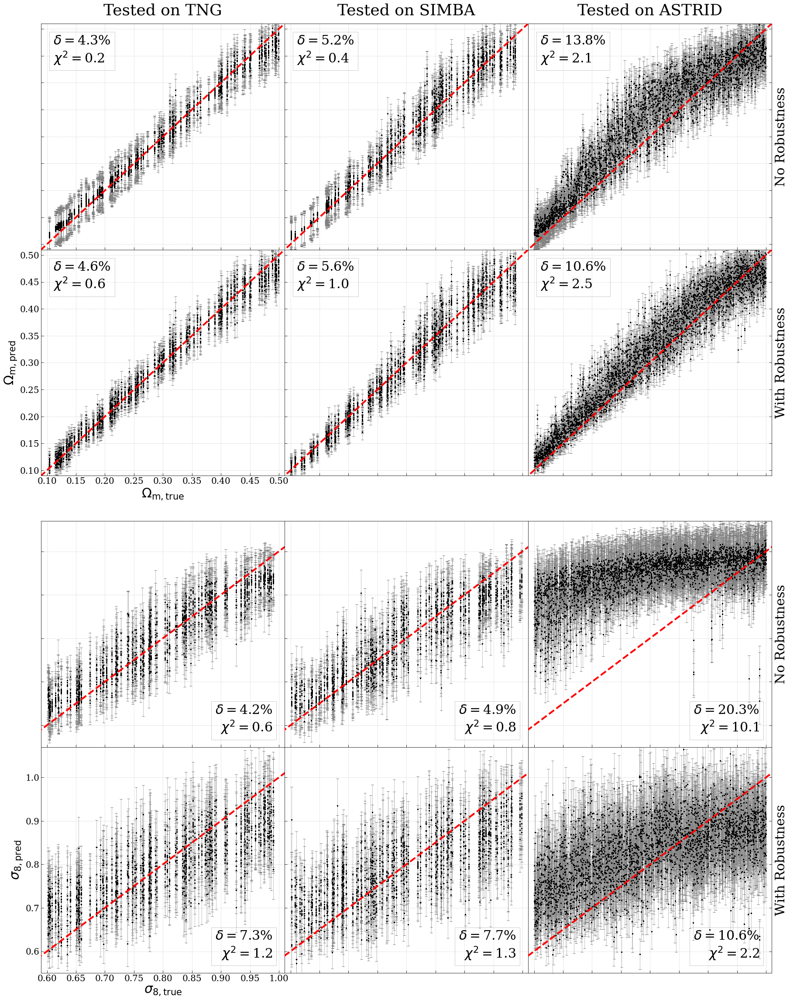

In [24]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,5
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,40),
                                      hspace=0.00,wspace=0.00, gridspec={"height_ratios":[1,1,0.2,1,1]})

for i in range(X):
    axes[i,2].get_xaxis().set_visible(False)
    axes[i,2].get_yaxis().set_visible(False)
    axes[i,2].axis("off")

#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid]
ast  = [ast_zero, ast_mid]
for i in range(X):
    for j in range(2):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        #axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        axes[i,j].plot(ideal1,ideal1,"r",ls='--',lw=4,zorder=40)
        
        #rel_err = np.mean(np.abs(y_res))*100
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.05, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == 1 and i == 0:
            axes[i,j].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[i,j].set_ylabel(r"$\Omega_\mathrm{m, pred}$")
            #axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.09,0.51)
        axes[i,j].set_ylim(0.09,0.51)
        #axes[i,j].set_ylim(-.5,.8)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Robustness', 'With Robustness']
for i in range(2):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])


#pu.remove_inner_axes(axes,(X,Y))
par = 1 # sigma_8
ideal1 = np.linspace(0.0,2,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_high]
ast  = [ast_zero, ast_high]
for i in range(X):
    for j in range(2):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        axes[i,j+3].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j+3].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        #axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        axes[i,j+3].plot(ideal1,ideal1,"r",ls='--',lw=4,zorder=40)
        
        #rel_err = np.mean(np.abs(y_res))*100
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j+3].text(.95, .05, text,
         ha='right', va='bottom', transform=axes[i,j+3].transAxes,
         bbox=props)
        
        axes[i,j+3].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j+3].grid(ls=':')
        if j == 1 and i == 0:
            axes[i,j+3].set_xlabel(r"$\sigma_\mathrm{8, true}$")
            axes[i,j+3].set_ylabel(r"$\sigma_\mathrm{8, pred}$")
            #xes[i,j].set_ylabel(r"$\frac{\sigma_\mathrm{8, pred}-\sigma_\mathrm{8, true}}{\sigma_\mathrm{8, true}}$")
        else:
            axes[i,j+3].set_xticklabels([])
            axes[i,j+3].set_yticklabels([])
        axes[i,j+3].set_xlim(0.59,1.01)
        axes[i,j+3].set_ylim(0.55,1.07)
        #axes[i,j].set_ylim(-.35,.7)

        
#axes[0,0].set_title('Tested on TNG',pad=20)
#axes[1,0].set_title('Tested on SIMBA',pad=20)
#axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Robustness', 'With Robustness']
for i in range(2):
    axes[X-1,i+3].yaxis.set_label_position("right")
    axes[X-1,i+3].yaxis.tick_right()
    axes[X-1,i+3].set_ylabel(labels[i])

plt.savefig('paper_plot/TNG_SIMBA_HI_performance_combined_new.png',dpi=200, bbox_inches='tight')

#### Accuracy vs robustness

### EACH TNG + SIMBA + ASTRID + EAGLE

#### Dataload

In [11]:
sims = ['TNG', 'SIMBA', 'ASTRID', 'EAGLE']; field='HI'
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'

externals = [[tmp2 for tmp2 in sims if tmp is not tmp2] for tmp in sims]
data = []
ext  = []
for i, sim in enumerate(sims):
    study_name = f"{sim}_HI_cnn_zero_monopole_1_new_split"
    storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
    path       = f"/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
    print(path, sim)
    if os.path.isfile(path):
        print("file exists!")
        mist = MIST(sim=[sim], field=field, batch_size=32, 
                    data_type = 'image',
                    normalization=True,
                    monopole = True,
                    device=device, robust_axis='sim')
        mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="vib_cnn",num_trial=None, fpath=fpath)
        mist.get_score_cnn()
        data.append(mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False))
        tmp = list()
        for sim_ext in externals[i]:
            tmp.append(mist.test_on_cnn(sim_ext, show_score=True, data_return=True,show_plot=False))
        ext.append(tmp)

/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_HI_cnn_zero_monopole_1_new_split.db TNG
file exists!
num_trial=226, params={'dropout': 0.392921393002671, 'hidden': 5, 'lr': 0.0037886317452164, 'wd': 1.577698787187829e-06, 'z_dim': 242} 
$\Omega_m$: MSE=0.000, % error=5.727%, R2 score=0.981,chi2=220164826.122, bias=-0.012
$\sigma_8$: MSE=0.001, % error=3.274%, R2 score=0.928,chi2=12403050455.125, bias=0.002
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.008, % error=21.892%, R2 score=0.384,chi2=309033997364496.062, bias=0.025
$\sigma_8$: MSE=0.020, % error=14.772%, R2 score=-0.473,chi2=240768996007807.750, bias=-0.061
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.001, % error=8.455%, R2 score=0.901,chi2=324410697428.789, bias=0.011
$\sigma_8$: MSE=0.020, % error=15.874%, R2 score=-0.475,chi2=106556241626.648, bias=-0.097
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.008, % error=20.024%, R2 score=0.431,chi2=4423472018.991, bias=0.069
$\sigma_8$: MSE=0.02

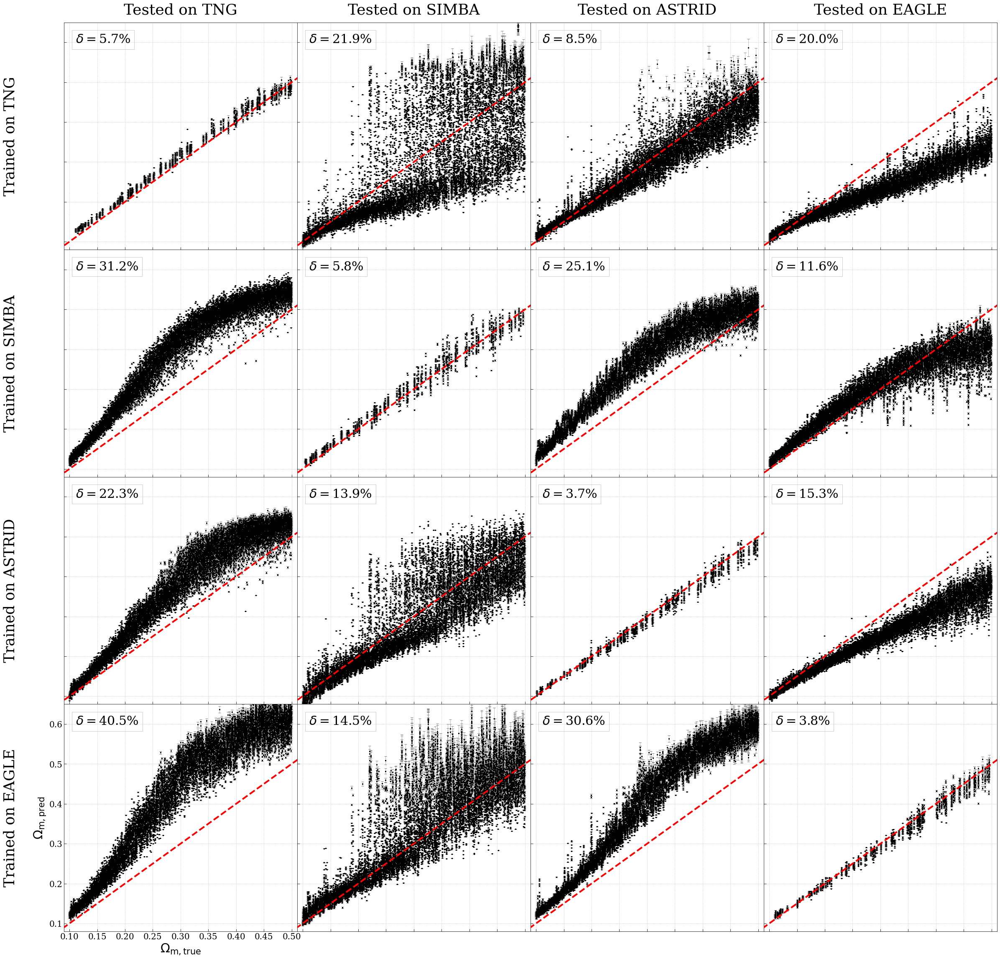

In [21]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 4,4
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(40,40),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
param = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
index_ext = {'TNG':0, 'SIMBA':1, 'ASTRID':2, 'EAGLE':3}

for i in range(Y):
    k=0
    for j in range(X):
    
        if (i == j):
            y_true = data[i][0][0][:,param]
            y_mean = data[i][1][0][:,param]
            y_std  = data[i][2][0][:,param]
        else:
            data_tmp = data[i]
            y_true = ext[i][k][0][:,param]
            y_mean = ext[i][k][1][0][:,param]
            y_std  = ext[i][k][1][1][:,param]
            k += 1


        
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        axes[j,i].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[j,i].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        #axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        axes[j,i].plot(ideal1,ideal1,"r",ls='--',lw=4,zorder=40)
        
        #rel_err = np.mean(np.abs(y_res))*100
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%"""
#$\\chi^2=${xi2:.1f}"""
        axes[j,i].text(.05, .95, text,
         ha='left', va='top', transform=axes[j,i].transAxes,
         bbox=props)
        
        axes[j,i].tick_params(direction='in', axis='both', which='both', length=6)
        axes[j,i].grid(ls=':')
        if i == Y-1 and j == 0:
            axes[j,i].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[j,i].set_ylabel(r"$\Omega_\mathrm{m, pred}$")
            #axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[j,i].set_xticklabels([])
            axes[j,i].set_yticklabels([])
        axes[j,i].set_xlim(0.09,0.51)
        axes[j,i].set_ylim(0.08,0.65)
    
        #axes[i,j].set_ylim(-.5,.8)

axes[0,0].text(-0.2,0.5, 'Trained on TNG', fontsize=35, rotation=90, horizontalalignment='right', verticalalignment='center', transform=axes[0,0].transAxes)
axes[0,1].text(-0.2,0.5, 'Trained on SIMBA', fontsize=35, rotation=90, horizontalalignment='right', verticalalignment='center', transform=axes[0,1].transAxes)
axes[0,2].text(-0.2,0.5, 'Trained on ASTRID', fontsize=35, rotation=90, horizontalalignment='right', verticalalignment='center', transform=axes[0,2].transAxes)
axes[0,3].text(-0.2,0.5, 'Trained on EAGLE', fontsize=35, rotation=90, horizontalalignment='right', verticalalignment='center', transform=axes[0,3].transAxes)

axes[0,0].set_title('Tested on TNG',    pad=20)
axes[1,0].set_title('Tested on SIMBA',  pad=20)
axes[2,0].set_title('Tested on ASTRID', pad=20)
axes[3,0].set_title('Tested on EAGLE',  pad=20)
plt.savefig('paper_plot/extensive_exploration_one_to_one_om.png',dpi=200, bbox_inches='tight')

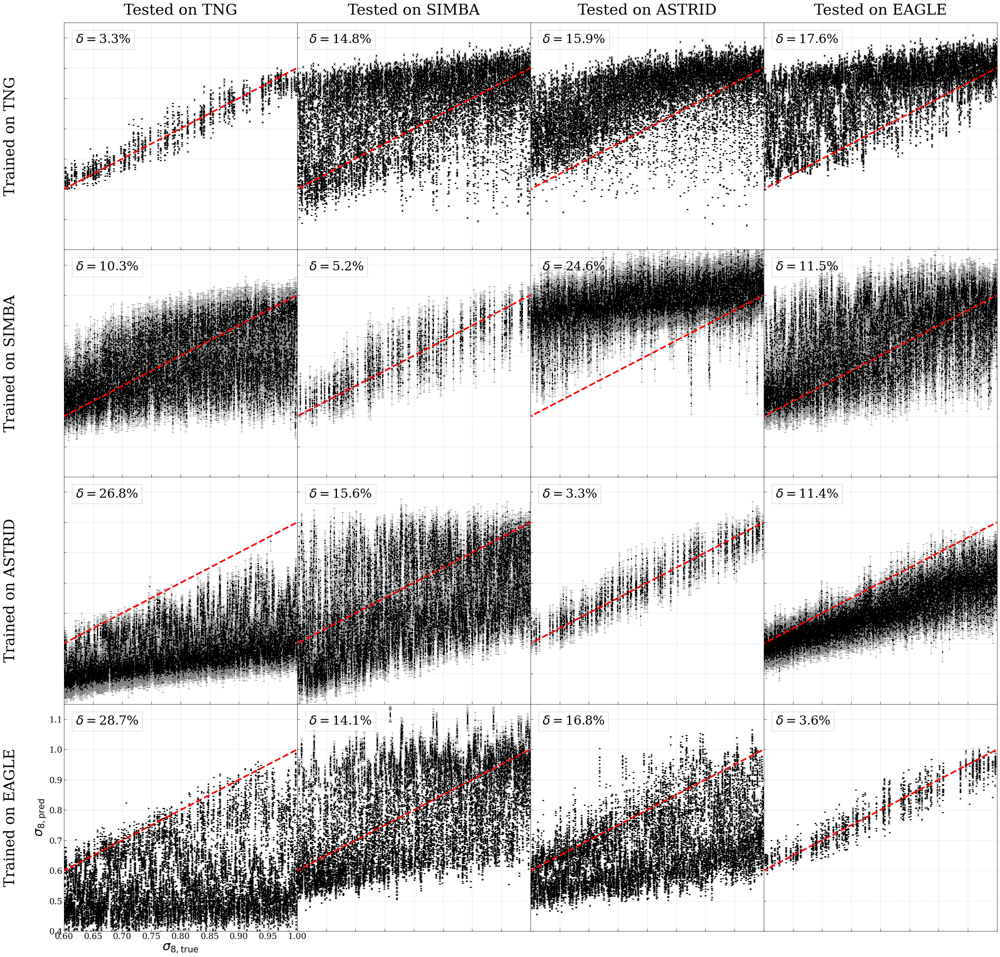

In [19]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 4,4
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(40,40),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
param = 1 # sigma_8
ideal1 = np.linspace(0.0,1.0,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
index_ext = {'TNG':0, 'SIMBA':1, 'ASTRID':2, 'EAGLE':3}

for i in range(Y):
    k=0
    for j in range(X):
    
        if (i == j):
            y_true = data[i][0][0][:,param]
            y_mean = data[i][1][0][:,param]
            y_std  = data[i][2][0][:,param]
        else:
            data_tmp = data[i]
            y_true = ext[i][k][0][:,param]
            y_mean = ext[i][k][1][0][:,param]
            y_std  = ext[i][k][1][1][:,param]
            k += 1


        
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        axes[j,i].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[j,i].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        #axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        axes[j,i].plot(ideal1,ideal1,"r",ls='--',lw=4,zorder=40)
        
        #rel_err = np.mean(np.abs(y_res))*100
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%"""
#$\\chi^2=${xi2:.1f}"""
        axes[j,i].text(.05, .95, text,
         ha='left', va='top', transform=axes[j,i].transAxes,
         bbox=props)
        
        axes[j,i].tick_params(direction='in', axis='both', which='both', length=6)
        axes[j,i].grid(ls=':')
        if i == Y-1 and j == 0:
            axes[j,i].set_xlabel(r"$\sigma_\mathrm{8, true}$")
            axes[j,i].set_ylabel(r"$\sigma_\mathrm{8, pred}$")
            #axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[j,i].set_xticklabels([])
            axes[j,i].set_yticklabels([])
        #axes[j,i].set_xlim(0.09,0.51)
        #axes[j,i].set_ylim(0.08,0.58)
        axes[j,i].set_xlim(0.6,1.)
        axes[j,i].set_ylim(0.4,1.15)
    
        #axes[i,j].set_ylim(-.5,.8)

axes[0,0].text(-0.2,0.5, 'Trained on TNG', fontsize=35, rotation=90, horizontalalignment='right', verticalalignment='center', transform=axes[0,0].transAxes)
axes[0,1].text(-0.2,0.5, 'Trained on SIMBA', fontsize=35, rotation=90, horizontalalignment='right', verticalalignment='center', transform=axes[0,1].transAxes)
axes[0,2].text(-0.2,0.5, 'Trained on ASTRID', fontsize=35, rotation=90, horizontalalignment='right', verticalalignment='center', transform=axes[0,2].transAxes)
axes[0,3].text(-0.2,0.5, 'Trained on EAGLE', fontsize=35, rotation=90, horizontalalignment='right', verticalalignment='center', transform=axes[0,3].transAxes)

axes[0,0].set_title('Tested on TNG',    pad=20)
axes[1,0].set_title('Tested on SIMBA',  pad=20)
axes[2,0].set_title('Tested on ASTRID', pad=20)
axes[3,0].set_title('Tested on EAGLE',  pad=20)
plt.savefig('paper_plot/extensive_exploration_one_to_one_sigma.png',dpi=200, bbox_inches='tight')

## Robust vs Performance

Text(0, 0.5, 'Relative Error of $\\sigma_8$ (%)')

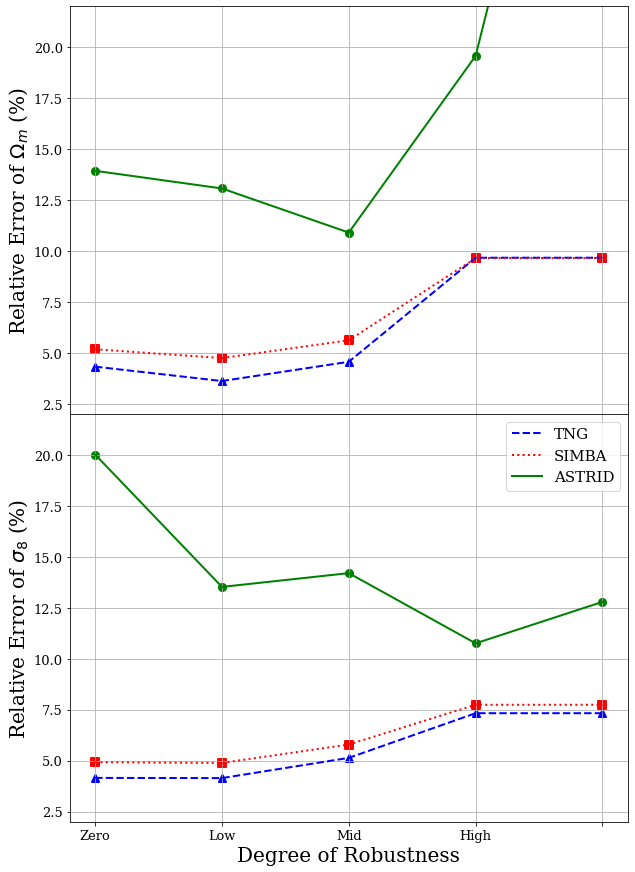

In [32]:
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['xtick.labelsize'] = 13
plt.rcParams['ytick.labelsize'] = 13
plt.rcParams['font.family']='serif'
X, Y = 1,2
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(10,15),
                                      hspace=0.00,wspace=0.001)
#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,2,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_low, data_mid, data_high, data_high]#2, data_high3]
ast  = [ast_zero, ast_low, ast_mid, ast_high, ast_high2] #, ast_high3]
rel_om = np.zeros((3,len(data)))
xi_om = np.zeros((3,len(data)))
X=3;Y=5;
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        rel_om[i,j] = rel_err
        xi_om[i,j]  = xi2

par = 1
rel_sig = np.zeros((3,len(data)))
xi_sig = np.zeros((3,len(data)))
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        rel_sig[i,j] = rel_err
        xi_sig[i,j]  = xi2
        
color = ['b','r','g']
ls = ["--",":","-"]
marker = ['^', 's', 'o']
for i in range(3):
    axes[0].plot(range(len(ast)), rel_om[i,:], c=color[i], lw=2, ls=ls[i])
    axes[0].scatter(range(len(ast)), rel_om[i,:], c=color[i], lw=2, marker=marker[i], s=50)
label = ['TNG', 'SIMBA', 'ASTRID']
for i in range(3):
    axes[1].plot(range(len(ast)), rel_sig[i,:], c=color[i], lw=2, label=label[i], ls=ls[i])
    axes[1].scatter(range(len(ast)), rel_sig[i,:], c=color[i], lw=2, marker=marker[i], s=50)
axes[0].set_ylim(2,22)
axes[1].set_ylim(2,22)
axes[0].grid()
axes[1].grid()
#axes[1].set_yticklabels([])
axes[0].set_xticklabels(['Zero', 'Low', 'Mid', 'High'])
axes[1].set_xticklabels(['Zero', 'Low', 'Mid', 'High'])
axes[0].set_xticks(range(len(ast)))
axes[1].set_xticks(range(len(ast)))
axes[1].legend(fontsize=15)
axes[1].set_xlabel("Degree of Robustness")
axes[0].set_ylabel("Relative Error of $\Omega_m$ (%)")
axes[1].set_ylabel("Relative Error of $\sigma_8$ (%)")
#axes[0].set_title("$\Omega_m$",fontsize=25)
#axes[1].set_title("$\sigma_8$",fontsize=25)
#plt.savefig('paper_plot/robust_relative_error.png',dpi=200, bbox_inches='tight')

## Many realizations

### One sim

In [ ]:
sims = ['TNG', 'SIMBA', 'ASTRID', 'EAGLE']; field='HI'
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'

externals = [[tmp2 for tmp2 in sims if tmp is not tmp2] for tmp in sims]
data = []
ext  = []
#for i, sim in enumerate(sims):

sim = 'TNG'; i = 0;

study_name = f"{sim}_HI_cnn_zero_monopole_1_new_split"
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
path       = f"/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
print(path, sim)


for i, sim in enumerate(sims[1:]):
    rel_err     = []
    crs_rel_err = []
    for num_trial in range(1000):
        path_trial = f"/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/model/optuna/{sim}_HI_cnn_zero_monopole_1_new_split_{num_trial}_vib.pt"
        if os.path.isfile(path) and os.path.isfile(path_trial):
            print("file exists!")
            mist = MIST(sim=[sim], field=field, batch_size=32, 
                        data_type = 'image',
                        normalization=True,
                        monopole = True,
                        device=device, robust_axis='sim')
            try:
                mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="vib_cnn",num_trial=num_trial, fpath=fpath)
                #mse_om, mse_sig, _,_,_ = mist.get_score_cnn()
                data = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
                y_true   = data[0][0][:,0]
                y_mean   = data[1][0][:,0]
                y_std    = data[2][0][:,0]
                y_res_om_0 = np.mean(np.abs((y_mean-y_true)/y_true))*100
                y_true   = data[0][0][:,1]
                y_mean   = data[1][0][:,1]
                y_std    = data[2][0][:,1]
                y_res_sg_0 = np.mean(np.abs((y_mean-y_true)/y_true))*100
    
                print(y_res_om)
                if y_res_om > 10:
                    print(y_res_om)
                    continue
                    
                tmp = list()
                for sim_ext in externals[i]:
                    data = mist.test_on_cnn(sim_ext, show_score=True, data_return=True,show_plot=False)
                    y_true = data[0][:,0]
                    y_mean = data[1][0][:,0]
                    y_std  = data[1][1][:,0]
                    y_res_om = np.mean(np.abs((y_mean-y_true)/y_true))*100
                    print(y_res_om)
    
                    y_true = data[0][:,1]
                    y_mean = data[1][0][:,1]
                    y_std  = data[1][1][:,1]
                    y_res_sg = np.mean(np.abs((y_mean-y_true)/y_true))*100
                    
                    tmp.append([num_trial, y_res_om, y_res_sg])
                crs_rel_err.append(tmp)
                rel_err.append([num_trial, y_res_om_0, y_res_sg_0])
            except:
                continue
    np.save(f"rel_err_{sim}", rel_err)
    np.save(f"crs_rel_err_{sim}", crs_rel_err)



/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_HI_cnn_zero_monopole_1_new_split.db TNG
file exists!
file exists!
file exists!
file exists!
file exists!
num_trial=4, params={'dropout': 0.009299126986091595, 'hidden': 8, 'lr': 6.056139119707281e-06, 'wd': 0.0012321207975960092, 'z_dim': 430} 
file exists!
num_trial=5, params={'dropout': 0.24998350616178436, 'hidden': 7, 'lr': 0.0016981070187158825, 'wd': 5.093266625213401e-08, 'z_dim': 63} 
file exists!
num_trial=6, params={'dropout': 0.08835311707573336, 'hidden': 8, 'lr': 2.76372749685535e-06, 'wd': 1.8790519557534366e-05, 'z_dim': 1645} 
file exists!
num_trial=7, params={'dropout': 0.17940806174716623, 'hidden': 8, 'lr': 1.3207626260563813e-06, 'wd': 8.035483056746344e-06, 'z_dim': 1701} 
file exists!
num_trial=8, params={'dropout': 0.39031722892469295, 'hidden': 7, 'lr': 4.474770004030887e-05, 'wd': 1.0819839670713472e-07, 'z_dim': 368} 
file exists!
num_trial=9, params={'dropout': 0.20647319137616973, 'hidden'

In [4]:
print("Done!")

Done!


In [6]:
print(rel_err, crs_rel_err)

[[5, 5.324342280004053, 4.163797522454904], [8, 8.616870279250467, 10.951299940032792], [9, 6.89385044490222, 8.615349618720122], [17, 6.889199341613611, 4.7329721376518075], [18, 6.056125602239408, 4.483578860847206], [19, 6.087393284788288, 5.063388674208083], [20, 6.995285163040206, 4.218167763160726], [21, 6.811196849633923, 4.026004822856355], [22, 7.431053753111739, 6.796919664830668], [23, 7.991696553383236, 7.169620086664865], [24, 8.064792753714833, 9.045016454988767], [25, 7.194736476059596, 7.5658597737593025], [26, 7.624596918388978, 7.722804521016942], [27, 7.663831538821155, 10.442010549326728], [28, 6.435084580898298, 4.445253653507994], [29, 5.793625418345394, 3.8156183635796177], [30, 6.5883857569735, 4.5963433659432456], [31, 6.885956728855228, 4.891104094329095], [32, 7.140789822152548, 5.71168618067494], [33, nan, nan], [34, 7.0923655499846046, 5.76804399078725], [38, 8.540715720495552, 10.921127974810043], [39, 7.201965317237987, 8.482158308200962], [40, 8.90575671

In [7]:
rel_err

[[5, 5.324342280004053, 4.163797522454904],
 [8, 8.616870279250467, 10.951299940032792],
 [9, 6.89385044490222, 8.615349618720122],
 [17, 6.889199341613611, 4.7329721376518075],
 [18, 6.056125602239408, 4.483578860847206],
 [19, 6.087393284788288, 5.063388674208083],
 [20, 6.995285163040206, 4.218167763160726],
 [21, 6.811196849633923, 4.026004822856355],
 [22, 7.431053753111739, 6.796919664830668],
 [23, 7.991696553383236, 7.169620086664865],
 [24, 8.064792753714833, 9.045016454988767],
 [25, 7.194736476059596, 7.5658597737593025],
 [26, 7.624596918388978, 7.722804521016942],
 [27, 7.663831538821155, 10.442010549326728],
 [28, 6.435084580898298, 4.445253653507994],
 [29, 5.793625418345394, 3.8156183635796177],
 [30, 6.5883857569735, 4.5963433659432456],
 [31, 6.885956728855228, 4.891104094329095],
 [32, 7.140789822152548, 5.71168618067494],
 [33, nan, nan],
 [34, 7.0923655499846046, 5.76804399078725],
 [38, 8.540715720495552, 10.921127974810043],
 [39, 7.201965317237987, 8.48215830820

In [5]:
np.save("rel_err_tng", rel_err)
np.save("crs_rel_err_tng", crs_rel_err)

In [18]:
rel_err = np.load("rel_err_tng.npy")
crs_rel_err = np.load("crs_rel_err_tng.npy")
rel_err = np.array(rel_err)
crs_rel_err = np.array(crs_rel_err)

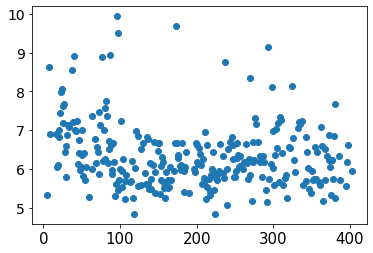

In [13]:
plt.scatter(rel_err[:,0], rel_err[:,1])

In [19]:
rel_err.shape, crs_rel_err.shape

((333, 3), (276, 3, 2))

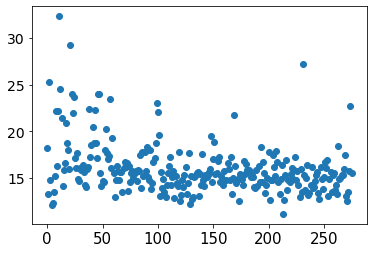

In [21]:
plt.scatter(range(crs_rel_err[:,i,1].shape[0]), crs_rel_err[:,i,1])

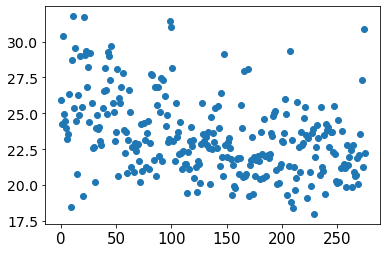

In [24]:
i=0
plt.scatter(range(crs_rel_err[:,i,1].shape[0]), crs_rel_err[:,i,0])

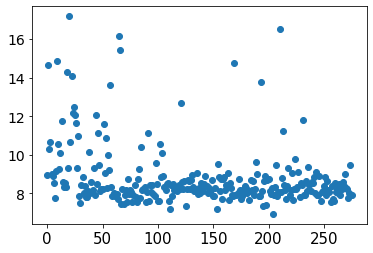

In [25]:
i=1
plt.scatter(range(crs_rel_err[:,i,1].shape[0]), crs_rel_err[:,i,0])

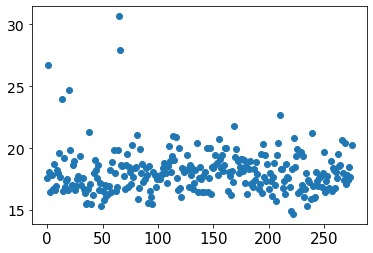

In [26]:
i=2
plt.scatter(range(crs_rel_err[:,i,1].shape[0]), crs_rel_err[:,i,0])

In [ ]:
    np.save(f"rel_err_{sim}", rel_err)
    np.save(f"crs_rel_err_{sim}", crs_rel_err)

### Two sims

In [5]:
import torch
import gc

In [ ]:
sims = ['TNG', 'SIMBA', 'ASTRID', 'EAGLE']; field='HI'
study_names = ["HI_cnn_enc_dec_zero_monopole_1","HI_cnn_zero_monopole_1_new","HI_cnn_zero_monopole_1_new_split"]
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'


combinations = list(itertools.combinations(sims, 2))
externals = [[x for x in sims if x not in comb] for comb in combinations]
data   = list()
params = list()
label  = list()

for i, comb in enumerate(combinations):
    auc = []
    for fname in study_names:
        study_name = f"{comb[0]}_{comb[1]}_" + fname
        storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
        path       = f"/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
        if os.path.isfile(path):  
            print(path, comb)
            for num_trial in range(1000):
                path_trial = f"/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/model/optuna/{study_name}_{num_trial}_vib.pt"
                if os.path.isfile(path_trial): 
                    print("file exists!")
                    try:
                        vib_umap = UMAP(sim=list(comb),field=field,study_name=study_name, fpath=fpath, num_trial=num_trial)#, ext_sim='ASTRID')
                        auc.append([num_trial, vib_umap.auc])
                    except:
                        continue
                    torch.cuda.empty_cache()
                    gc.collect()
    np.save(f"auc_{comb[0]}_{comb[1]}", auc)

/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_SIMBA_HI_cnn_enc_dec_zero_monopole_1.db ('TNG', 'SIMBA')
file exists!
file exists!
file exists!
file exists!


# ETC

### TNG vs SIMBA

#### Dataload

In [17]:
sim  = ['TNG', 'SIMBA']; field = 'T'
study_name = "TNG_SIMBA_T_cnn_zero_monopole_1_new"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_zero = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_zero = mist.test_on_cnn('ASTRID', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.001, % error=5.750%, R2 score=0.955,chi2=0.712, bias=-0.002
$\sigma_8$: MSE=0.002, % error=4.689%, R2 score=0.828,chi2=0.943, bias=0.003
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.002, % error=14.398%, R2 score=0.833,chi2=2.919, bias=-0.027
$\sigma_8$: MSE=0.021, % error=14.086%, R2 score=-0.596,chi2=9.963, bias=0.070


In [19]:
sim  = ['TNG', 'SIMBA']; field = 'T'
study_name = "TNG_SIMBA_T_cnn_low_monopole_1_new"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_low = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_low = mist.test_on_cnn('ASTRID', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.001, % error=6.777%, R2 score=0.949,chi2=0.604, bias=-0.003
$\sigma_8$: MSE=0.002, % error=4.913%, R2 score=0.816,chi2=0.872, bias=-0.002
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.002, % error=12.552%, R2 score=0.875,chi2=1.608, bias=-0.013
$\sigma_8$: MSE=0.020, % error=13.746%, R2 score=-0.537,chi2=8.695, bias=0.075


In [20]:
sim  = ['TNG', 'SIMBA']; field = 'T'
study_name = "TNG_SIMBA_T_cnn_mid_monopole_1_new"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_mid = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_mid = mist.test_on_cnn('ASTRID', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.001, % error=6.683%, R2 score=0.949,chi2=0.864, bias=-0.004
$\sigma_8$: MSE=0.003, % error=5.188%, R2 score=0.789,chi2=0.973, bias=0.004
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.003, % error=18.737%, R2 score=0.739,chi2=10.644, bias=-0.040
$\sigma_8$: MSE=0.030, % error=16.739%, R2 score=-1.276,chi2=41418.969, bias=0.111


#### plot for $\Omega_m$

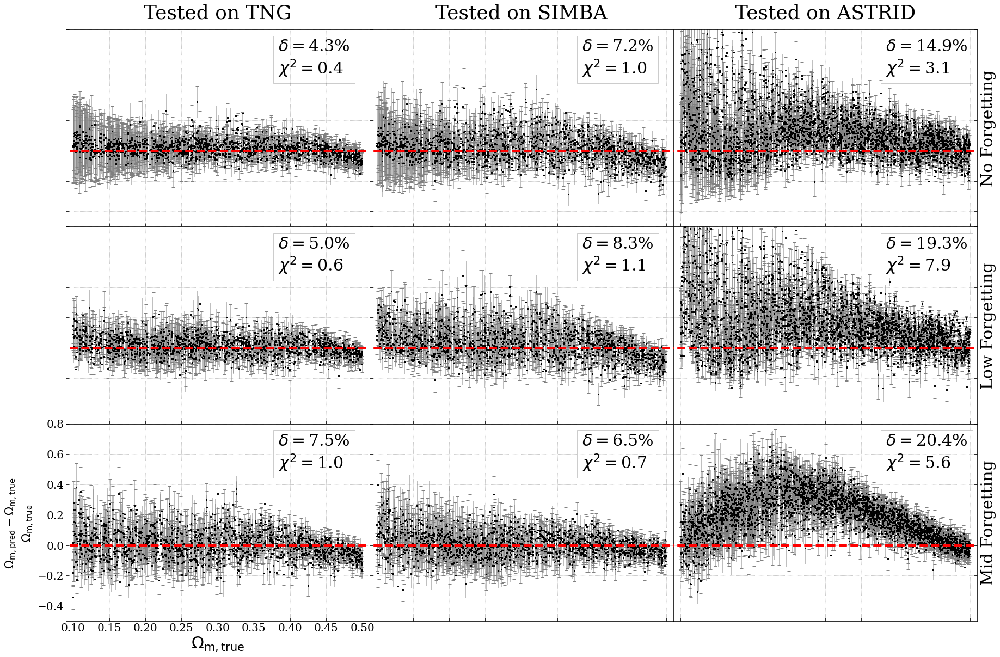

In [21]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,3
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid, data_high]
ast  = [ast_zero, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.09,0.51)
        axes[i,j].set_ylim(-.5,.8)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(Y):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_T_performance_om.png',dpi=200, bbox_inches='tight')

#### Plot for $\sigma_8$

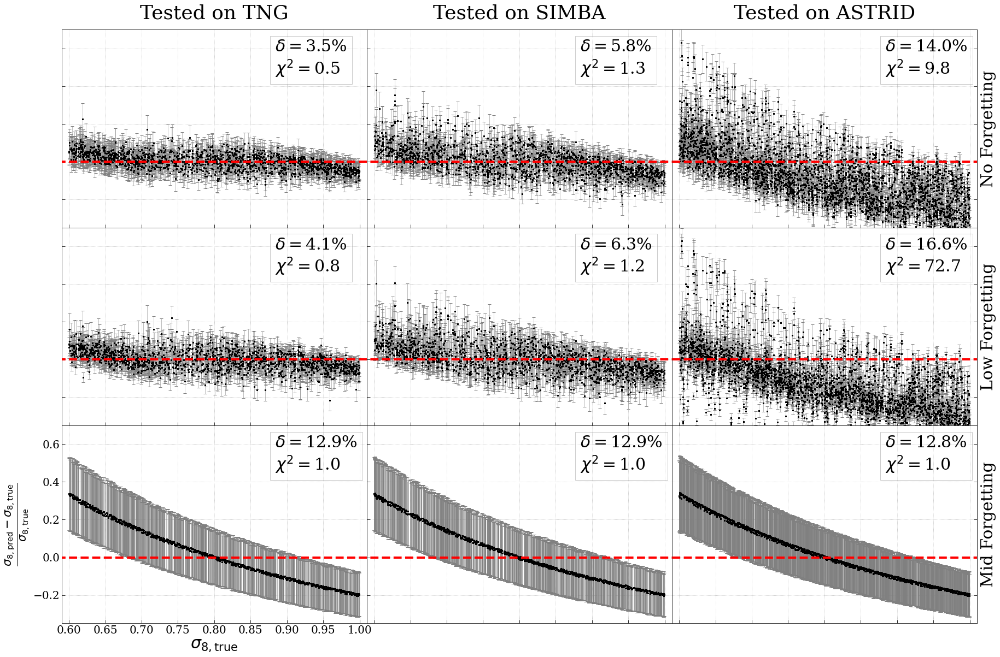

In [22]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,3
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 1 # sigma_8
ideal1 = np.linspace(0.0,2,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid, data_high]
ast  = [ast_zero, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\sigma_\mathrm{8, true}$")
            axes[i,j].set_ylabel(r"$\frac{\sigma_\mathrm{8, pred}-\sigma_\mathrm{8, true}}{\sigma_\mathrm{8, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.59,1.01)
        axes[i,j].set_ylim(-.35,.7)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(Y):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_T_performance_sig.png',dpi=200, bbox_inches='tight')